In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scanpy as sc
from matplotlib import rc_context
import anndata as ad
import gc

In [2]:
# suppress future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
from statannotations.Annotator import Annotator
sc.set_figure_params(vector_friendly=True, dpi_save=600) 

In [4]:
df = pd.read_csv('tables/PubMed_Timeline_Results_by_Year.csv', comment='#')
df.fillna(0, inplace=True)
df = df[df.Year >= 2006]
df = df.melt(id_vars=['Year'], var_name='Type', value_vars=['Count', 'Dataset'])

In [5]:
sns.set_theme(style='white')

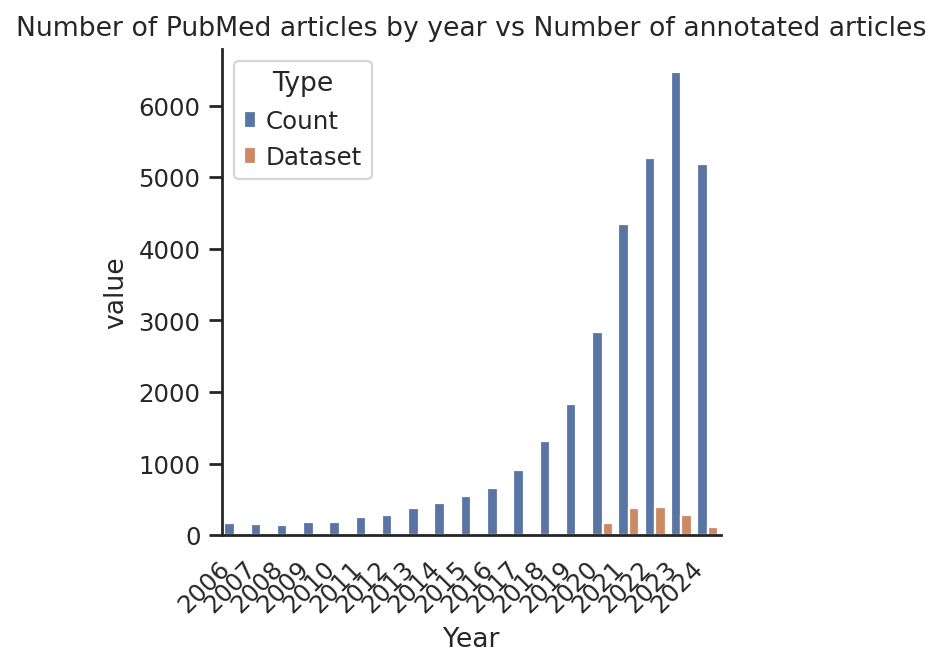

In [6]:
g = sns.barplot(data=df, x='Year', y='value', hue='Type')
sns.despine()
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
g.set_title('Number of PubMed articles by year vs Number of annotated articles')
g.yaxis.set_ticks_position('left')
plt.savefig('figures/fig1/PubMed_Timeline_Results_by_Year.pdf', bbox_inches='tight')

In [7]:
df_metrics = pd.read_csv('tables/benchmark_results_all.csv', comment='#')
metadata = pd.read_excel('tables/Table S1.xlsx')
metadata.rename(columns={'Dataset No.': 'dataset'}, inplace=True)
df_metrics = df_metrics.join(metadata.set_index('dataset'), on='dataset')
df_metrics = df_metrics.loc[~df_metrics.method.str.contains('no_context')]

In [8]:
df_metrics.loc[df_metrics.method == 'deepseek_v2_5', 'method'] = 'deepseek v2.5'
df_metrics.loc[df_metrics.method == 'claude_3_5', 'method'] = 'Claude 3.5'

In [9]:
df_metrics.columns

Index(['dataset', 'method', 'n_cells', 'real_cell_types',
       'predicted_cell_types', 'average_accuracy', 'group_accuracy', 'ARI',
       'low_certainty_accuracy', 'medium_certainty_accuracy',
       'high_certainty_accuracy', 'common_accuracy', 'rare_0.05_accuracy',
       'rare_0.01_accuracy', 'very_rare_accuracy', 'batch_std',
       'within_batch_var', 'total_var', 'batch_effect_ratio', 'Article',
       'cellxgene Link', 'Processing Details', 'Raw Data', 'Tissue'],
      dtype='object')

In [10]:
sns.set_theme(style='white')

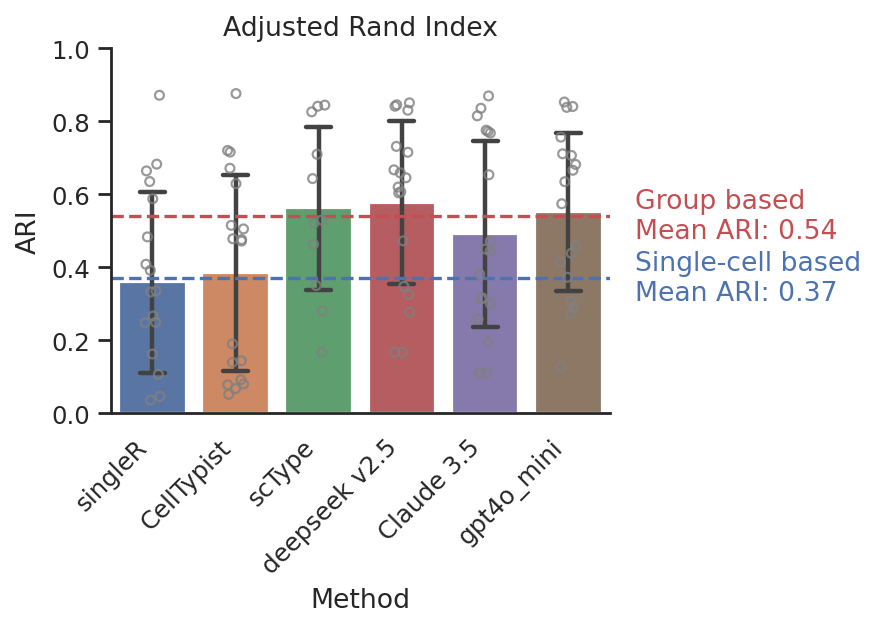

In [11]:
with rc_context({'figure.figsize': (4, 3)}):
    g = sns.barplot(data=df_metrics, x='method', y='ARI', 
                        ci="sd", 
                        capsize=0.3, errwidth=2, dodge=True)
    sns.stripplot(data=df_metrics, x='method', y='ARI', size=5, alpha=0.8, color='gray', marker="$\circ$")
    g.set_title('Adjusted Rand Index')
    g.set_ylabel('ARI')
    g.set_xlabel('Method')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_ylim(0, 1)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

    # calculate mean of ARI
    mean_ari_marker_gene = df_metrics[df_metrics['method'].isin(['scType', 'deepseek v2.5', 'Claude 3.5', 'gpt4o_mini'])]['ARI'].mean()
    mean_ari_marker_gene = round(mean_ari_marker_gene, 2)
    # add horizontal line for mean ARI
    plt.axhline(y=mean_ari_marker_gene, color='r', linestyle='--')
    plt.text(5.8, mean_ari_marker_gene-0.06, f'Group based\nMean ARI: {mean_ari_marker_gene}', color='r')

    mean_ari_single_cell = df_metrics[df_metrics['method'].isin(['singleR', 'CellTypist'])]['ARI'].mean()
    mean_ari_single_cell = round(mean_ari_single_cell, 2)
    # add horizontal line for mean ARI
    plt.axhline(y=mean_ari_single_cell, color='b', linestyle='--')
    plt.text(5.8, mean_ari_single_cell-0.06, f'Single-cell based\nMean ARI: {mean_ari_single_cell}', color='b')

    plt.savefig('figures/fig1/Ari_for_scextract.pdf', bbox_inches='tight')
    plt.show()

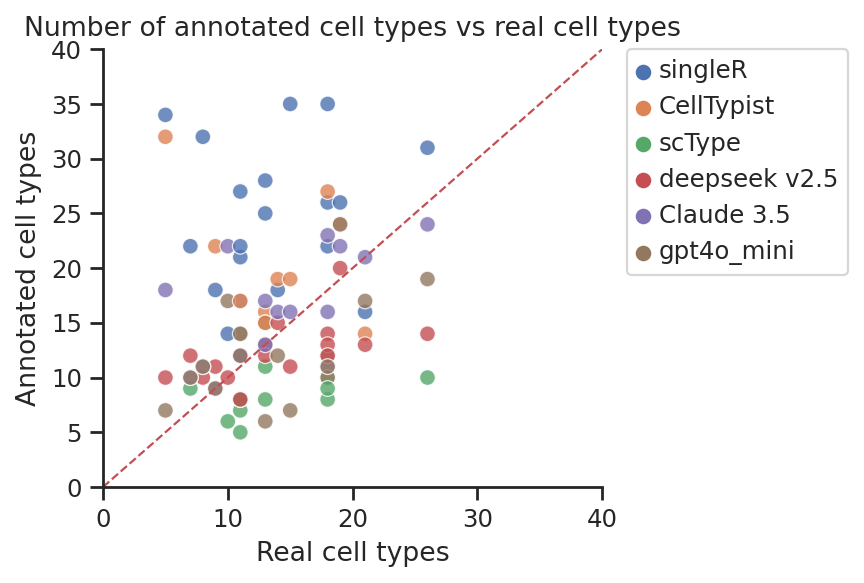

In [12]:
with rc_context({'figure.figsize': (4, 3.6)}):
    g = sns.scatterplot(data=df_metrics, x='real_cell_types', y='predicted_cell_types', hue='method', s=50, alpha=0.8)
    # set legend outside
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.despine()
    g.set_xlim(0, 40)
    g.set_ylim(0, 40)
    g.yaxis.set_ticks_position('left')
    g.xaxis.set_ticks_position('bottom')
    # line
    x = np.linspace(0, 40, 10)
    y = x
    plt.plot(x, y, 'r--', linewidth=1)
    g.set_title('Number of annotated cell types vs real cell types')
    g.set_xlabel('Real cell types')
    g.set_ylabel('Annotated cell types')
    plt.savefig('figures/fig1/Number_of_annotated_cell_types_vs_real_cell_types.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2132175/1716391937.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations = df_metrics.groupby('method').apply(


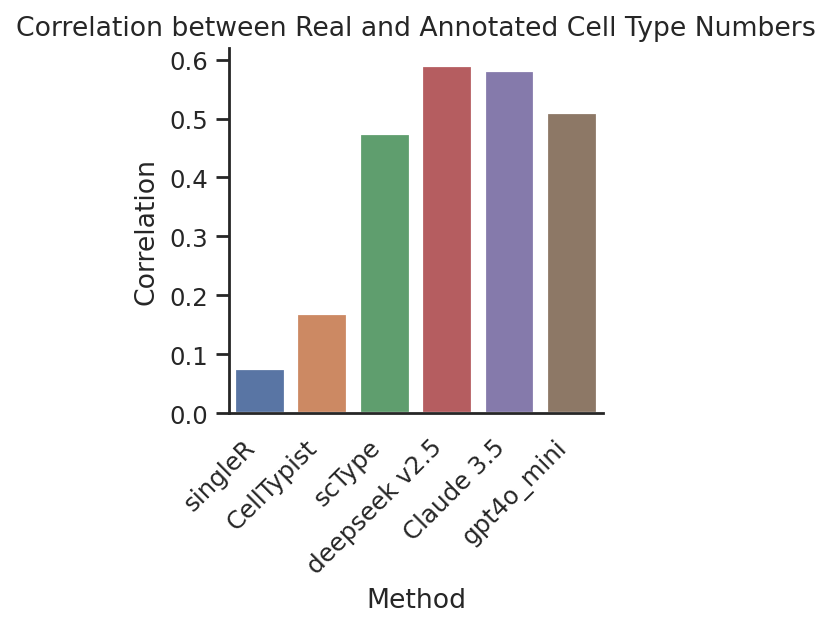

In [13]:
with rc_context({'figure.figsize': (3, 3)}):
    # Calculate correlation for each LLM
    correlations = df_metrics.groupby('method').apply(
        lambda x: x['real_cell_types'].corr(x['predicted_cell_types'], method='pearson')
    )
    methods = ['singleR', 'CellTypist', 'scType', 'deepseek v2.5', 'Claude 3.5', 'gpt4o_mini']
    g = sns.barplot(x=correlations.index, y=correlations.values, order=methods)
    g.set_title('Correlation between Real and Annotated Cell Type Numbers')
    g.set_xlabel('Method')
    g.set_ylabel('Correlation')
    g.yaxis.set_ticks_position('left')
    # g.xaxis.set_ticks_position('bottom')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    # g.set_ylim(0, 1)
    sns.despine()
    plt.savefig('figures/fig1/Correlation_between_Real_and_Annotated_Cell_Type_Numbers_for_Each_LLM.pdf', bbox_inches='tight')
    plt.show()

### Similarity

In [14]:
df_metrics.columns

Index(['dataset', 'method', 'n_cells', 'real_cell_types',
       'predicted_cell_types', 'average_accuracy', 'group_accuracy', 'ARI',
       'low_certainty_accuracy', 'medium_certainty_accuracy',
       'high_certainty_accuracy', 'common_accuracy', 'rare_0.05_accuracy',
       'rare_0.01_accuracy', 'very_rare_accuracy', 'batch_std',
       'within_batch_var', 'total_var', 'batch_effect_ratio', 'Article',
       'cellxgene Link', 'Processing Details', 'Raw Data', 'Tissue'],
      dtype='object')

In [15]:
# create palette for Tissue
palette = sns.color_palette("tab20", 20)
palette = palette[:len(df_metrics['Tissue'].unique())]
tissue_palette = dict(zip(df_metrics['Tissue'].unique(), palette))

singleR vs. CellTypist: Wilcoxon test (paired samples), P_val:7.019e-01 Stat=7.600e+01
singleR vs. deepseek v2.5: Wilcoxon test (paired samples), P_val:7.629e-06 Stat=0.000e+00


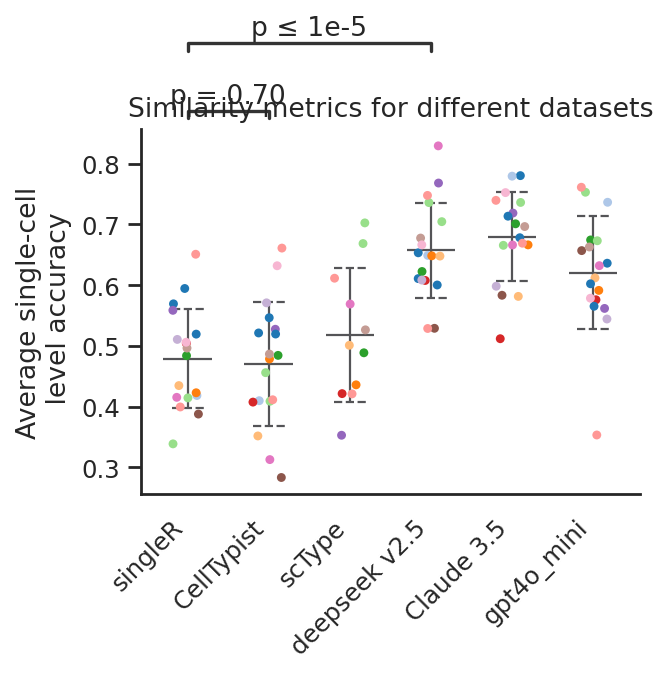

In [16]:
with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.stripplot(data=df_metrics, x='method', y='average_accuracy', 
                      hue='Tissue', jitter=0.2, size=4, palette=tissue_palette)
    
    # Calculate mean and SD for each group
    stats = df_metrics.groupby(['method'])['average_accuracy'].agg(['mean', 'std']).reset_index()
    
    # Plot mean ± SD lines
    for i, llm in enumerate(methods):
        row = stats[stats['method'] == llm]
        plt.hlines(y=row['mean'], xmin=i-0.3, xmax=i+0.3, linewidth=1, color='#545457', linestyle='-')
        plt.hlines(y=row['mean']-row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.hlines(y=row['mean']+row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.vlines(x=i, ymin=row['mean']-row['std'], ymax=row['mean']+row['std'], color='#545457', linewidth=1)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_title('Similarity metrics for different datasets')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Average single-cell\n level accuracy')
    g.set_xlabel('')
    plt.legend().remove()
    
    pairs = [('singleR', 'CellTypist'), ('singleR', 'deepseek v2.5')]
    annotator = Annotator(g, pairs=pairs, data=df_metrics, x='method', y='average_accuracy', order=methods)
    annotator.configure(test="Wilcoxon", text_format='simple', loc='outside', show_test_name=False)
    annotator.apply_and_annotate()
    
    plt.savefig('figures/fig1/Similarity_metrics_for_different_datasets.pdf', bbox_inches='tight')
    plt.show()

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


singleR vs. CellTypist: Wilcoxon test (paired samples), P_val:4.683e-01 Stat=6.800e+01
singleR vs. deepseek v2.5: Wilcoxon test (paired samples), P_val:7.629e-06 Stat=0.000e+00


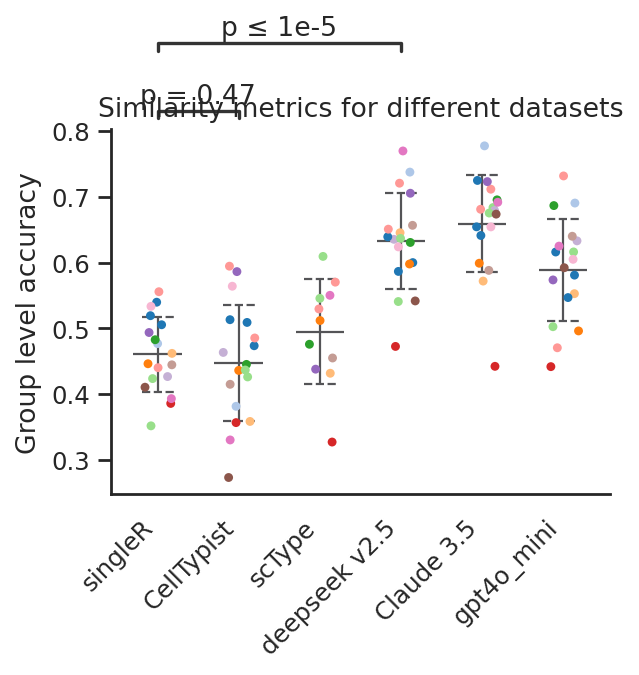

In [17]:
with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.stripplot(data=df_metrics, x='method', y='group_accuracy', 
                      hue='Tissue', jitter=0.2, size=4, palette=tissue_palette)
    
    # Calculate mean and SD for each group
    stats = df_metrics.groupby(['method'])['group_accuracy'].agg(['mean', 'std']).reset_index()
    
    # Plot mean ± SD lines
    for i, llm in enumerate(methods):
        row = stats[stats['method'] == llm]
        plt.hlines(y=row['mean'], xmin=i-0.3, xmax=i+0.3, linewidth=1, color='#545457', linestyle='-')
        plt.hlines(y=row['mean']-row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.hlines(y=row['mean']+row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.vlines(x=i, ymin=row['mean']-row['std'], ymax=row['mean']+row['std'], color='#545457', linewidth=1)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_title('Similarity metrics for different datasets')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Group level accuracy')
    g.set_xlabel('')
    plt.legend().remove()
    
    pairs = [('singleR', 'CellTypist'), ('singleR', 'deepseek v2.5')]
    annotator = Annotator(g, pairs=pairs, data=df_metrics, x='method', y='group_accuracy', order=methods)
    annotator.configure(test="Wilcoxon", text_format='simple', loc='outside', show_test_name=False)
    annotator.apply_and_annotate()
    
    plt.savefig('figures/fig1/Similarity_metrics_for_different_datasets_group_level.pdf', bbox_inches='tight')
    plt.show()

# Benchmark using OLS

In [18]:
df_metrics_ols = pd.read_csv('tables/benchmark_results_all_ols.csv', comment='#')
metadata = pd.read_excel('tables/Table S1.xlsx')
metadata.rename(columns={'Dataset No.': 'dataset'}, inplace=True)
df_metrics_ols = df_metrics_ols.join(metadata.set_index('dataset'), on='dataset')
df_metrics_ols = df_metrics_ols.loc[~df_metrics_ols.method.str.contains('no_context')]
df_metrics_ols.loc[df_metrics_ols.method == 'deepseek_v2_5', 'method'] = 'deepseek v2.5'
df_metrics_ols.loc[df_metrics_ols.method == 'claude_3_5', 'method'] = 'Claude 3.5'

In [19]:
df_metrics_ols.pivot_table(index='dataset', columns='method', values='average_accuracy')

method,CellTypist,Claude 3.5,deepseek v2.5,gpt4o_mini,scType,singleR
dataset,,,,,,
sample1,0.716376,0.794581,0.758239,0.671684,NaN,0.780631
sample10,0.470301,0.713673,0.685865,0.761342,NaN,0.685327
sample11,0.335595,0.894251,0.747750,0.732843,0.683396,0.495846
sample12,0.554998,0.710317,0.588881,0.641552,NaN,0.670546
sample14,0.569707,0.614584,0.635824,0.647343,0.583491,0.672731
sample16,0.803876,0.862254,0.803616,0.836066,NaN,0.876471
sample17,0.580544,0.915166,0.764170,0.803175,NaN,0.548847
sample18,0.615599,0.777979,0.653686,0.700242,0.522718,0.503887
sample19,0.541316,0.656056,0.724329,0.589526,0.356013,0.479679


In [20]:
# drop failed datasets
df_metrics_ols = df_metrics_ols[df_metrics_ols.dataset != 'sample21']

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


singleR vs. CellTypist: Wilcoxon test (paired samples), P_val:2.667e-02 Stat=3.000e+01
singleR vs. deepseek v2.5: Wilcoxon test (paired samples), P_val:5.054e-02 Stat=3.500e+01


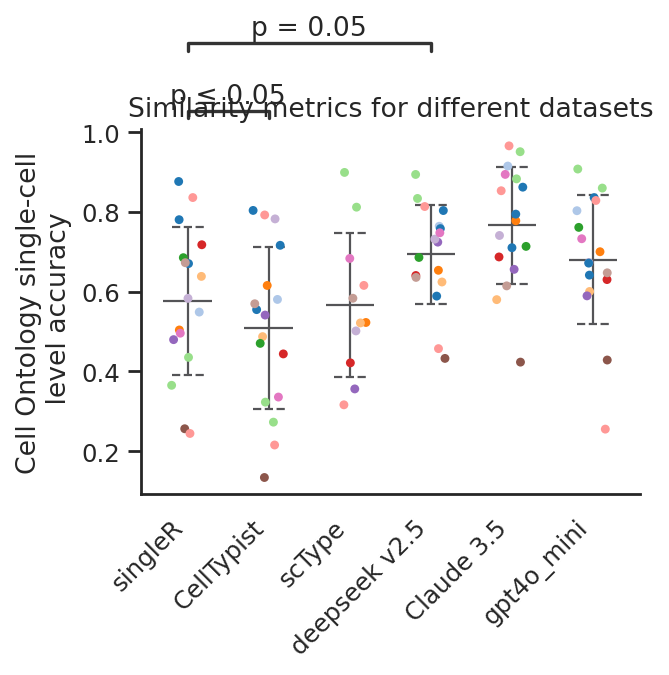

In [21]:
with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.stripplot(data=df_metrics_ols, x='method', y='average_accuracy',
                      hue='Tissue', jitter=0.2, size=4, palette=tissue_palette)
    
    # Calculate mean and SD for each group
    stats = df_metrics_ols.groupby(['method'])['average_accuracy'].agg(['mean', 'std']).reset_index()
    methods = ['singleR', 'CellTypist', 'scType', 'deepseek v2.5', 'Claude 3.5', 'gpt4o_mini']
    # Plot mean ± SD lines
    for i, llm in enumerate(methods):
        row = stats[stats['method'] == llm]
        plt.hlines(y=row['mean'], xmin=i-0.3, xmax=i+0.3, linewidth=1, color='#545457', linestyle='-')
        plt.hlines(y=row['mean']-row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.hlines(y=row['mean']+row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.vlines(x=i, ymin=row['mean']-row['std'], ymax=row['mean']+row['std'], color='#545457', linewidth=1)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_title('Similarity metrics for different datasets')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Cell Ontology single-cell\n level accuracy')
    g.set_xlabel('')
    plt.legend().remove()
    
    pairs = [('singleR', 'CellTypist'), ('singleR', 'deepseek v2.5')]
    annotator = Annotator(g, pairs=pairs, data=df_metrics_ols, x='method', y='average_accuracy', order=methods)
    annotator.configure(test="Wilcoxon", text_format='simple', loc='outside', show_test_name=False)
    annotator.apply_and_annotate()
    
    plt.savefig('figures/fig1/Similarity_metrics_for_different_datasets_ols.pdf', bbox_inches='tight')
    plt.show()

singleR vs. CellTypist: Wilcoxon test (paired samples), P_val:4.874e-01 Stat=6.100e+01
singleR vs. deepseek v2.5: Wilcoxon test (paired samples), P_val:4.578e-05 Stat=2.000e+00


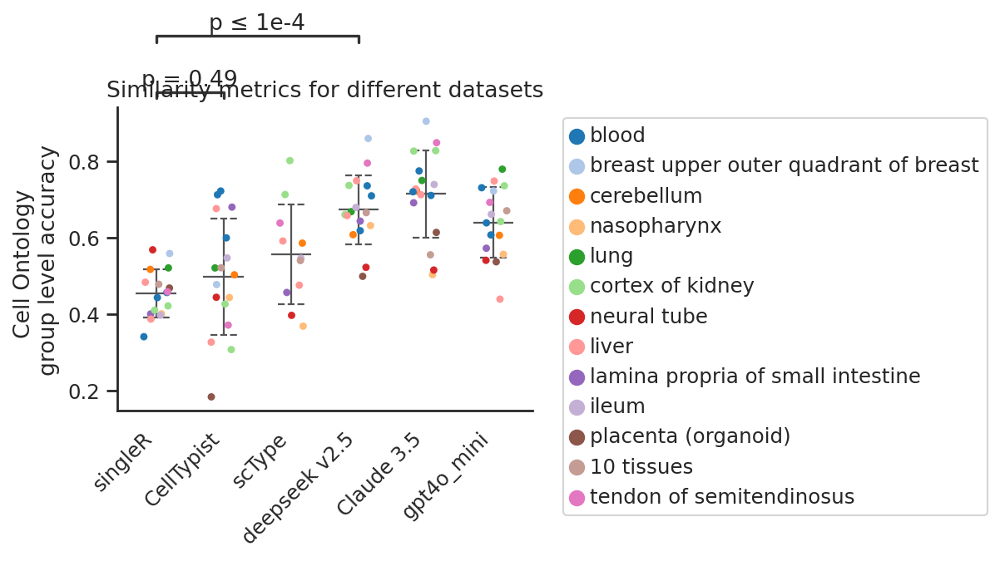

In [22]:
with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.stripplot(data=df_metrics_ols, x='method', y='group_accuracy', 
                      hue='Tissue', jitter=0.2, size=4, palette=tissue_palette)
    
    # Calculate mean and SD for each group
    stats = df_metrics_ols.groupby(['method'])['group_accuracy'].agg(['mean', 'std']).reset_index()
    methods = ['singleR', 'CellTypist', 'scType', 'deepseek v2.5', 'Claude 3.5', 'gpt4o_mini']
    # Plot mean ± SD lines
    for i, llm in enumerate(methods):
        row = stats[stats['method'] == llm]
        plt.hlines(y=row['mean'], xmin=i-0.3, xmax=i+0.3, linewidth=1, color='#545457', linestyle='-')
        plt.hlines(y=row['mean']-row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.hlines(y=row['mean']+row['std'], xmin=i-0.2, xmax=i+0.2, linewidth=1, color='#545457', linestyle='--')
        plt.vlines(x=i, ymin=row['mean']-row['std'], ymax=row['mean']+row['std'], color='#545457', linewidth=1)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_title('Similarity metrics for different datasets')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Cell Ontology \ngroup level accuracy')
    g.set_xlabel('')
    # plt.legend().remove()
    
    pairs = [('singleR', 'CellTypist'), ('singleR', 'deepseek v2.5')]
    annotator = Annotator(g, pairs=pairs, data=df_metrics_ols, x='method', y='group_accuracy', order=methods)
    annotator.configure(test="Wilcoxon", text_format='simple', loc='outside', show_test_name=False)
    annotator.apply_and_annotate()
    
    plt.savefig('figures/fig1/Similarity_metrics_for_different_datasets_group_level_ols.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2132175/130750513.py:11: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles = g.legend_.legendHandles


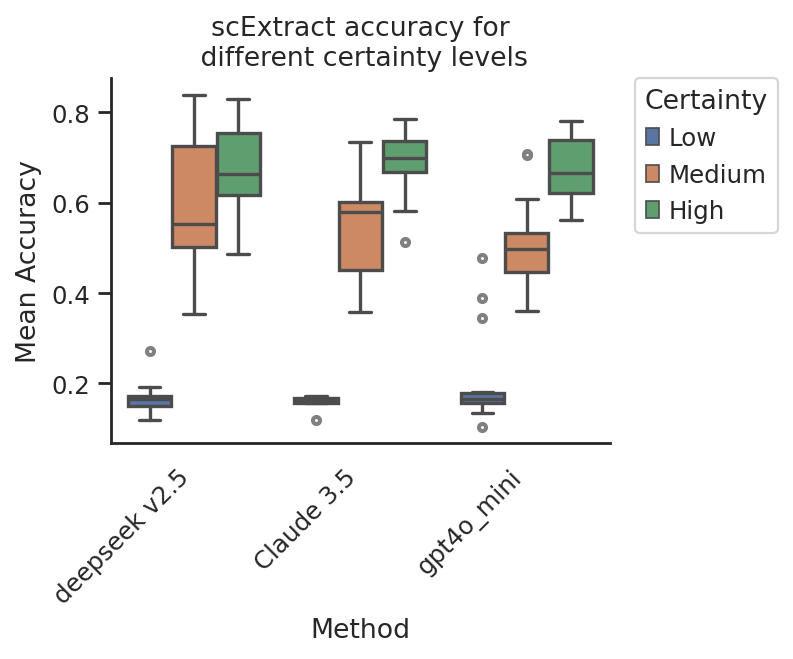

In [23]:
df_metrics_acc = df_metrics.loc[:, df_metrics.columns.str.contains('accuracy|dataset|method|Tissue')]
df_metrics_acc = df_metrics_acc.loc[df_metrics_acc.method.isin(['deepseek v2.5', 'Claude 3.5', 'gpt4o_mini'])]
df_metrics_acc = df_metrics_acc.loc[:, ['dataset', 'method', 'low_certainty_accuracy', 'medium_certainty_accuracy', 'high_certainty_accuracy']]
df_metrics_acc = df_metrics_acc.melt(id_vars=['dataset', 'method'], var_name='Certainty', value_name='Accuracy')

with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.boxplot(data=df_metrics_acc, x='method', y='Accuracy', hue='Certainty',
                    flierprops={'markerfacecolor': 'gray', 'markersize': 4,
                               'markeredgecolor': 'gray', 'marker': "$\circ$"},)
    sns.despine()
    handles = g.legend_.legendHandles
    plt.legend(handles=handles, labels=['Low', 'Medium', 'High'], 
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title='Certainty')
    g.yaxis.set_ticks_position('left')
    g.set_title('scExtract accuracy for\n different certainty levels')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Mean Accuracy')
    g.set_xlabel('Method')
    plt.savefig('figures/fig1/Accuracy_for_different_certainty_levels.pdf', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_2132175/1474657139.py:11: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles = g.legend_.legendHandles


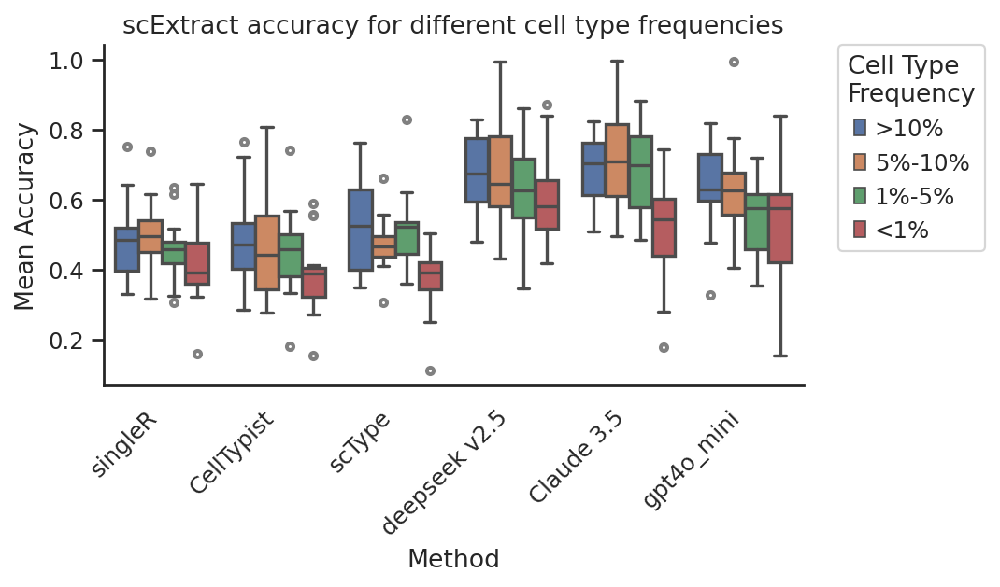

In [24]:
df_metrics_acc = df_metrics.loc[:, df_metrics.columns.str.contains('accuracy|dataset|method|Tissue')]
# df_metrics_acc = df_metrics_acc.loc[df_metrics_acc.method.isin(['deepseek v2.5', 'Claude 3.5', 'gpt4o_mini'])]
df_metrics_acc = df_metrics_acc.loc[:, ['dataset', 'method', 'common_accuracy', 'rare_0.05_accuracy', 'rare_0.01_accuracy', 'very_rare_accuracy']]
df_metrics_acc = df_metrics_acc.melt(id_vars=['dataset', 'method'], var_name='Certainty', value_name='Accuracy')

with plt.rc_context({'figure.figsize': [6, 3]}):
    g = sns.boxplot(data=df_metrics_acc, x='method', y='Accuracy', hue='Certainty',
                    flierprops={'markerfacecolor': 'gray', 'markersize': 4,
                               'markeredgecolor': 'gray', 'marker': "$\circ$"},)
    sns.despine()
    handles = g.legend_.legendHandles
    plt.legend(handles=handles, labels=['>10%', '5%-10%', '1%-5%', '<1%'], 
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title='Cell Type\nFrequency')
    g.yaxis.set_ticks_position('left')
    g.set_title('scExtract accuracy for different cell type frequencies')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Mean Accuracy')
    g.set_xlabel('Method')
    plt.savefig('figures/fig1/Accuracy_for_different_cell_type_frequencies.pdf', bbox_inches='tight')
    plt.show()

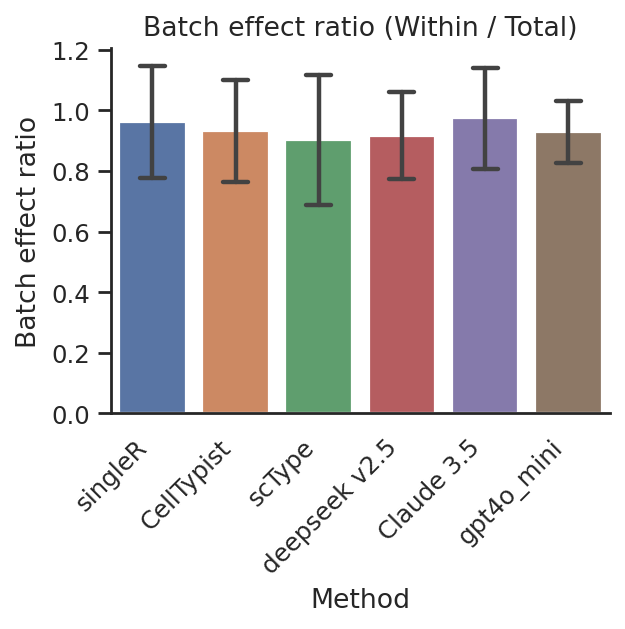

In [25]:
with plt.rc_context({'figure.figsize': [4, 3]}):
    g = sns.barplot(data=df_metrics, x='method', y='batch_effect_ratio', ci="sd", 
                    capsize=0.3, errwidth=2, dodge=True)
    sns.despine()
    g.yaxis.set_ticks_position('left')
    g.set_title('Batch effect ratio (Within / Total)')
    g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set_ylabel('Batch effect ratio')
    g.set_xlabel('Method')
    plt.savefig('figures/fig1/Batch_effect_ratio_for_different_methods.pdf', bbox_inches='tight')
    plt.show()

In [26]:
df_metrics = pd.read_csv('tables/benchmark_results_all.csv', comment='#')
metadata = pd.read_excel('tables/Table S1.xlsx')
metadata.rename(columns={'Dataset No.': 'dataset'}, inplace=True)
df_metrics = df_metrics.join(metadata.set_index('dataset'), on='dataset')
df_metrics = df_metrics.loc[df_metrics.method.str.contains('deepseek|claude|gpt4o')]
df_metrics['context'] = df_metrics['method'].apply(lambda x: True if 'no_context' not in x else False)
df_metrics['method'] = df_metrics['method'].apply(lambda x: x.replace('_no_context', ''))

In [27]:
df_metrics.loc[df_metrics.method == 'deepseek_v2_5', 'method'] = 'deepseek v2.5'
df_metrics.loc[df_metrics.method == 'claude_3_5', 'method'] = 'Claude 3.5'


Wilcoxon signed-rank test results for deepseek v2.5:
Statistic: 13.0000
p-value: 0.0007

Wilcoxon signed-rank test results for Claude 3.5:
Statistic: 21.0000
p-value: 0.0034

Wilcoxon signed-rank test results for gpt4o_mini:
Statistic: 41.0000
p-value: 0.0539


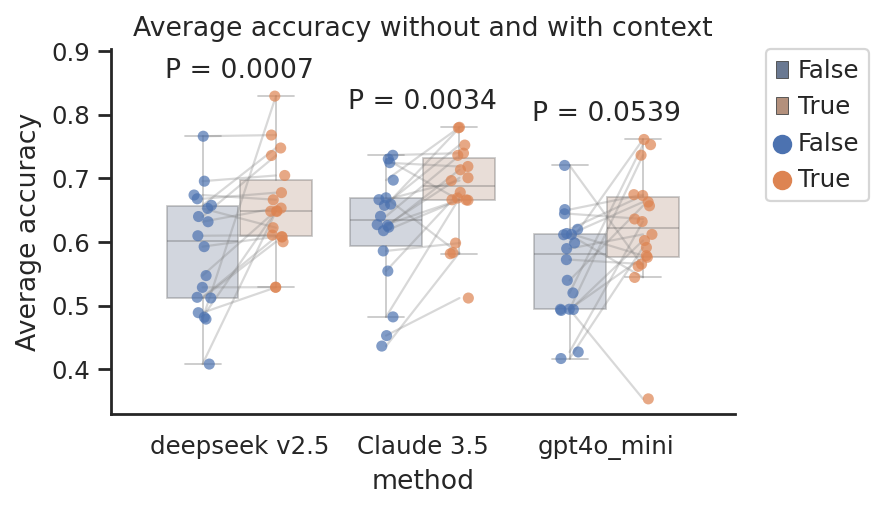

In [40]:
plt.figure(figsize=(5, 3))

g = sns.boxplot(data=df_metrics, x='method', y='average_accuracy', hue='context',
            saturation=0.4,
            width=0.8,
            linewidth=0.8,
            boxprops={'alpha': 0.3},
            whiskerprops={'alpha': 0.3},
            capprops={'alpha': 0.3},
            medianprops={'alpha': 0.3},
            fliersize=0)

sns.stripplot(data=df_metrics, x='method', y='average_accuracy', hue='context',
              dodge=True, marker='o', alpha=0.7, size=5)

n_methods = len(df_metrics['method'].unique())
offset = 0.2

g.set_title('Average accuracy without and with context')
g.set_ylabel('Average accuracy')
g.yaxis.set_ticks_position('left')
sns.despine()
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

for method in df_metrics['method'].unique():
    method_data = df_metrics[df_metrics['method'] == method]
    method_idx = list(df_metrics['method'].unique()).index(method)
    
    for dataset in method_data['dataset'].unique():
        points = method_data[method_data['dataset'] == dataset].sort_values('context')
        
        if len(points) == 2:
            x = [method_idx - offset, method_idx + offset]
            y = points['average_accuracy'].values
            
            plt.plot(x, y, color='gray', alpha=0.3, linewidth=1)

from scipy import stats

for method in df_metrics['method'].unique():
    method_data = df_metrics[df_metrics['method'] == method]
    
    no_context = method_data[method_data['context'] == False].sort_values('dataset')['average_accuracy'].values
    with_context = method_data[method_data['context'] == True].sort_values('dataset')['average_accuracy'].values
    
    statistic, p_value = stats.wilcoxon(no_context, with_context)
    
    print(f"\nWilcoxon signed-rank test results for {method}:")
    print(f"Statistic: {statistic:.4f}")
    print(f"p-value: {p_value:.4f}")
    
    method_idx = list(df_metrics['method'].unique()).index(method)
    
    max_y = max(max(no_context), max(with_context))
    y_pos = max_y + 0.02
    
    plt.text(method_idx, y_pos, f"P = {p_value:.4f}", ha='center', va='bottom')

plt.ylim(plt.ylim()[0], plt.ylim()[1] + 0.05)

plt.savefig('figures/fig1/Average_accuracy_without_and_with_context.pdf', bbox_inches='tight')
plt.show()

## Examples

In [165]:
import scanpy as sc
sc.set_figure_params(vector_friendly=True, dpi_save=600) 

In [168]:
adata_ben = sc.read_h5ad("/home/wu/datb1/AutoExtractSingleCell/01.benchmark_datasets/sample8/sample8_claude_3_5_benchmark.h5ad")

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


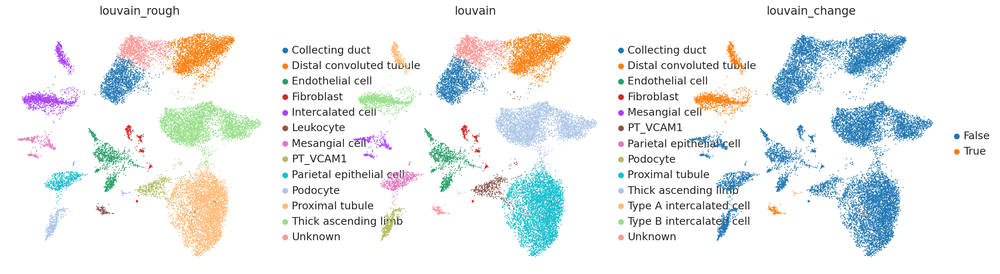

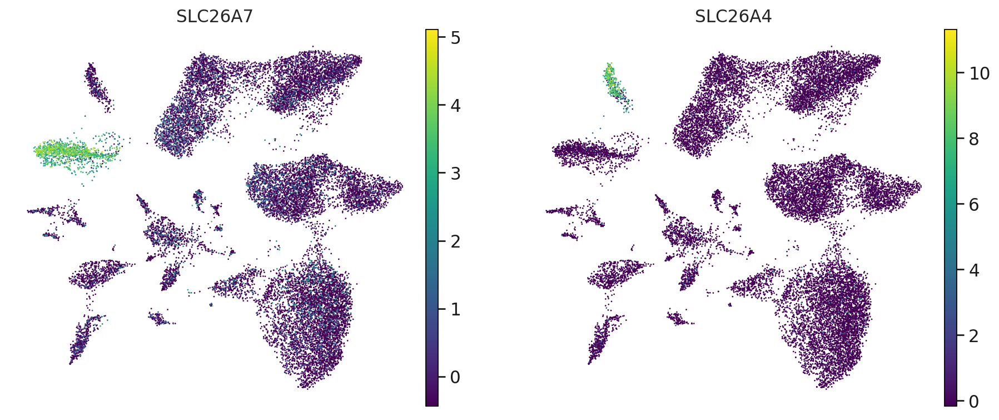

In [169]:
adata_ben.obs.loc[:, 'louvain_change'] = adata_ben.obs['louvain'].astype(str) != adata_ben.obs['louvain_rough'].astype(str)
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['louvain_rough', 'louvain', 'louvain_change'], ncols=3, frameon=False, show=False)
    plt.savefig('figures/fig1/sample8_claude_3_5_1_louvain_change.pdf')
    plt.show()
    
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['SLC26A7', 'SLC26A4'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False)
    plt.savefig('figures/fig1/sample8_claude_3_5_1_gene_expression.pdf')
    plt.show()

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


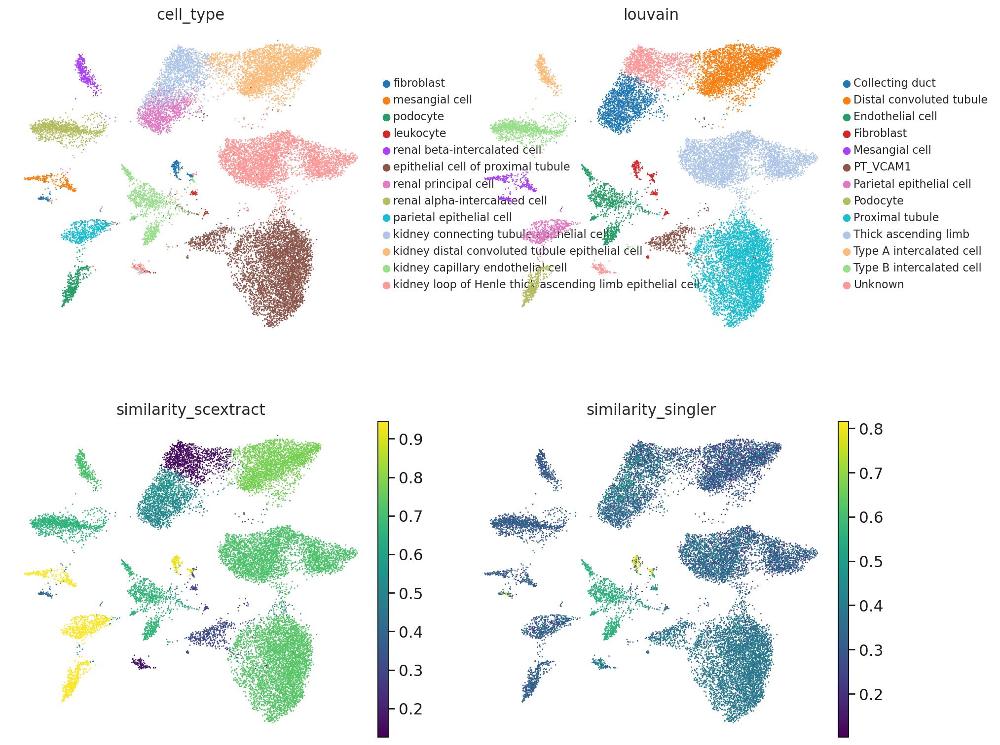

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


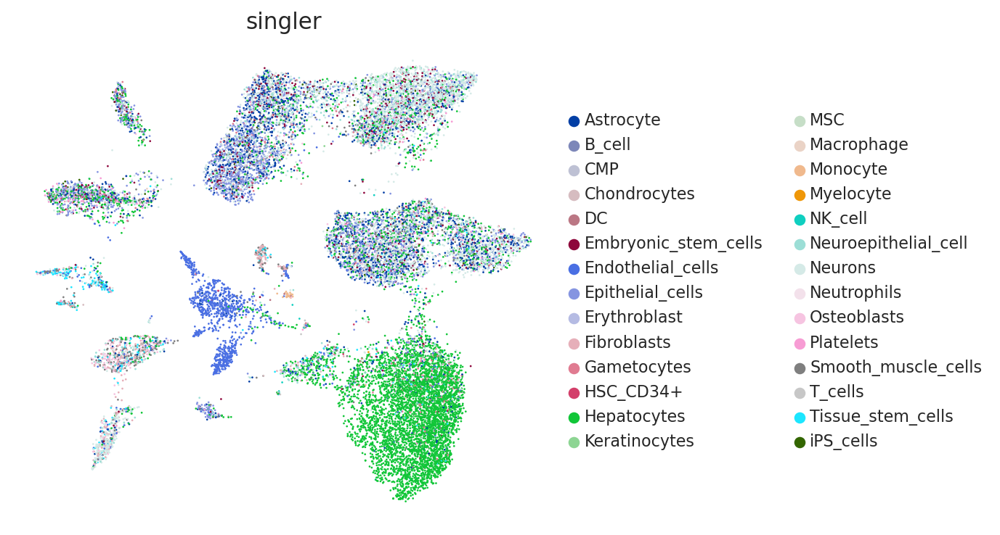

In [170]:
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['cell_type', 'louvain', 'similarity_scextract', 'similarity_singler'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10)
    plt.savefig('figures/fig1/sample8_claude_3_5_1_cell_type_similarity.pdf')
    plt.show()

with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['singler'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10)
    plt.savefig('figures/fig1/sample8_claude_3_5_1_cell_type_singler.pdf')
    plt.show()

In [172]:
adata_ben = sc.read_h5ad("/home/wu/datb1/AutoExtractSingleCell/01.benchmark_datasets/sample8/sample8_deepseek_v2_5_benchmark_all.h5ad")

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


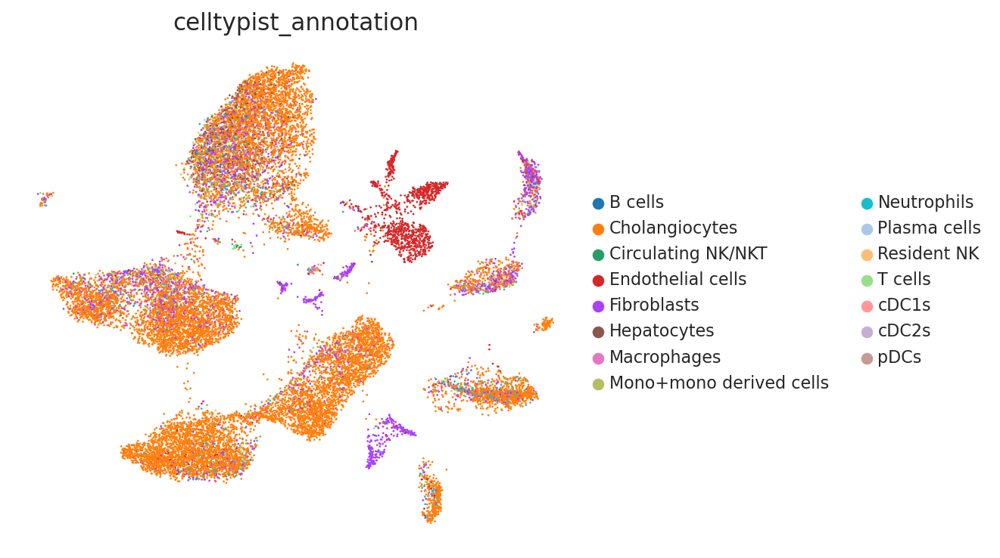

In [174]:
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['celltypist_annotation'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10)
    # plt.savefig('figures/fig1/sample8_claude_3_5_1_cell_type_singler.pdf')
    plt.show()

In [44]:
adata_ben = sc.read_h5ad("/home/wu/datb1/AutoExtractSingleCell/benchmark_datasets/sample8/sample8_claude_3_5_2_benchmark.h5ad")

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


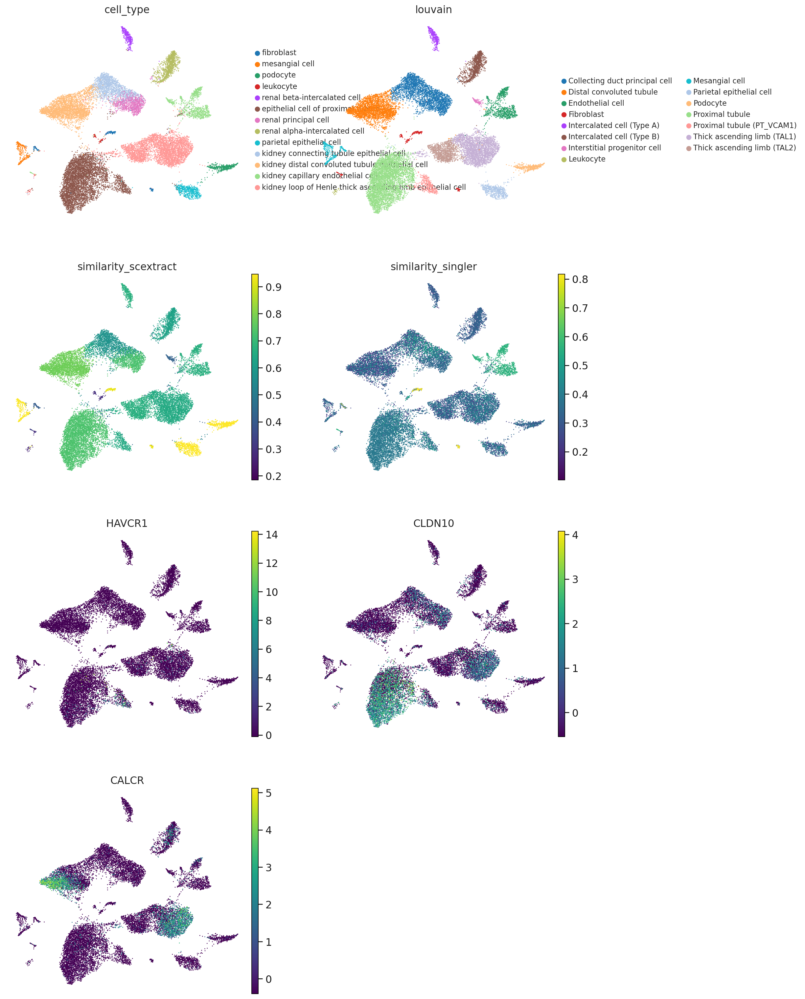

In [50]:
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['cell_type', 'louvain', 'similarity_scextract', 'similarity_singler', 'HAVCR1', 'CLDN10', 'CALCR'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    plt.savefig('figures/fig1/sample8_claude_3_5_2_cell_type_similarity.pdf')
    plt.show()

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


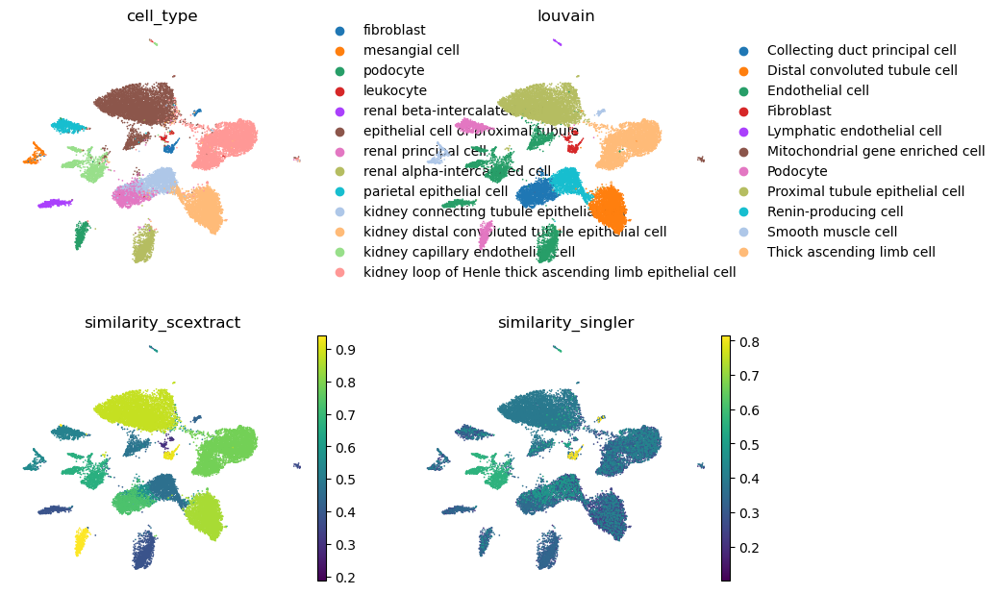

In [107]:
adata_ben = sc.read_h5ad("/home/wu/datb1/AutoExtractSingleCell/benchmark_datasets/sample8/sample8_deepseek_1_benchmark.h5ad")
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['cell_type', 'louvain', 'similarity_scextract', 'similarity_singler'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    plt.savefig('figures/fig1/sample8_claude_deepseek_1_cell_type_similarity.pdf')
    plt.show()

## Bad samples example: sample4

In [109]:
adata_ben = sc.read('/home/wu/datb1/AutoExtractSingleCell/benchmark_datasets/sample4/sample4_claude_3_5_1_benchmark.h5ad')

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


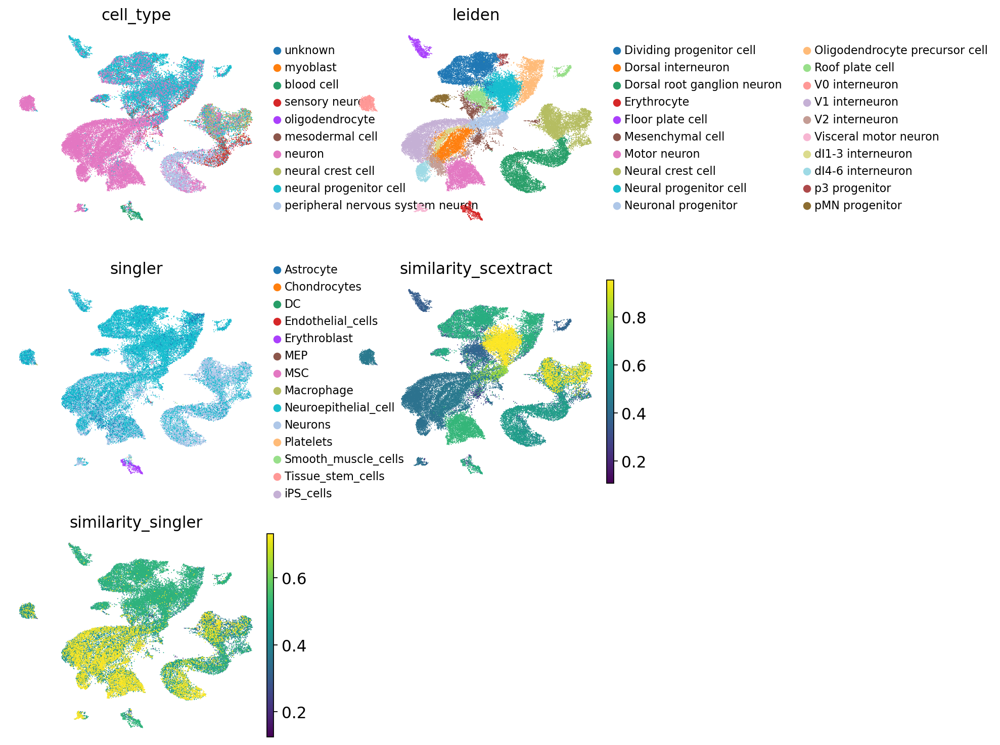

In [110]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ben, color=['cell_type', 'leiden', 'singler', 'similarity_scextract', 'similarity_singler'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    plt.savefig('figures/fig1/sample4_claude_claude_3_5_1_cell_type_similarity.pdf')
    plt.show()

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


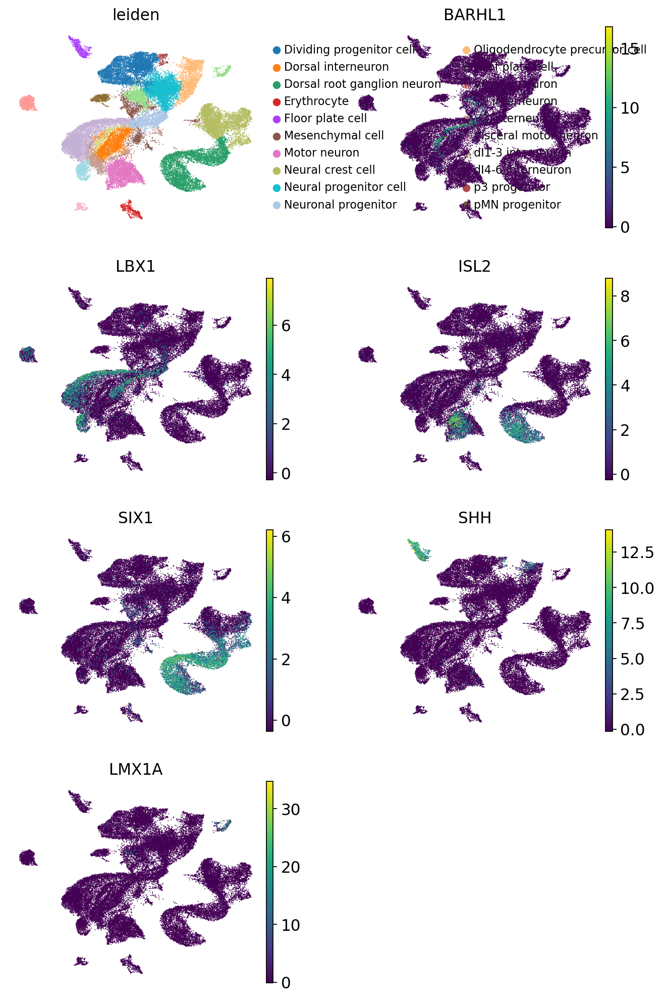

In [112]:
with rc_context({'figure.figsize': (4, 3.5)}):
    sc.pl.umap(adata_ben, color=['leiden', 'BARHL1', 'LBX1', 'ISL2', 'SIX1', 'SHH', 'LMX1A'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    plt.savefig('figures/fig1/sample4_claude_claude_3_5_1_gene_expression.pdf')
    plt.show()

In [19]:
adata_ben_ = sc.read('/home/wu/datb1/AutoExtractSingleCell/benchmark_datasets/sample4/sample4_deepseek_1_benchmark.h5ad')

/home/wu/mambaforge/envs/scanpy/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


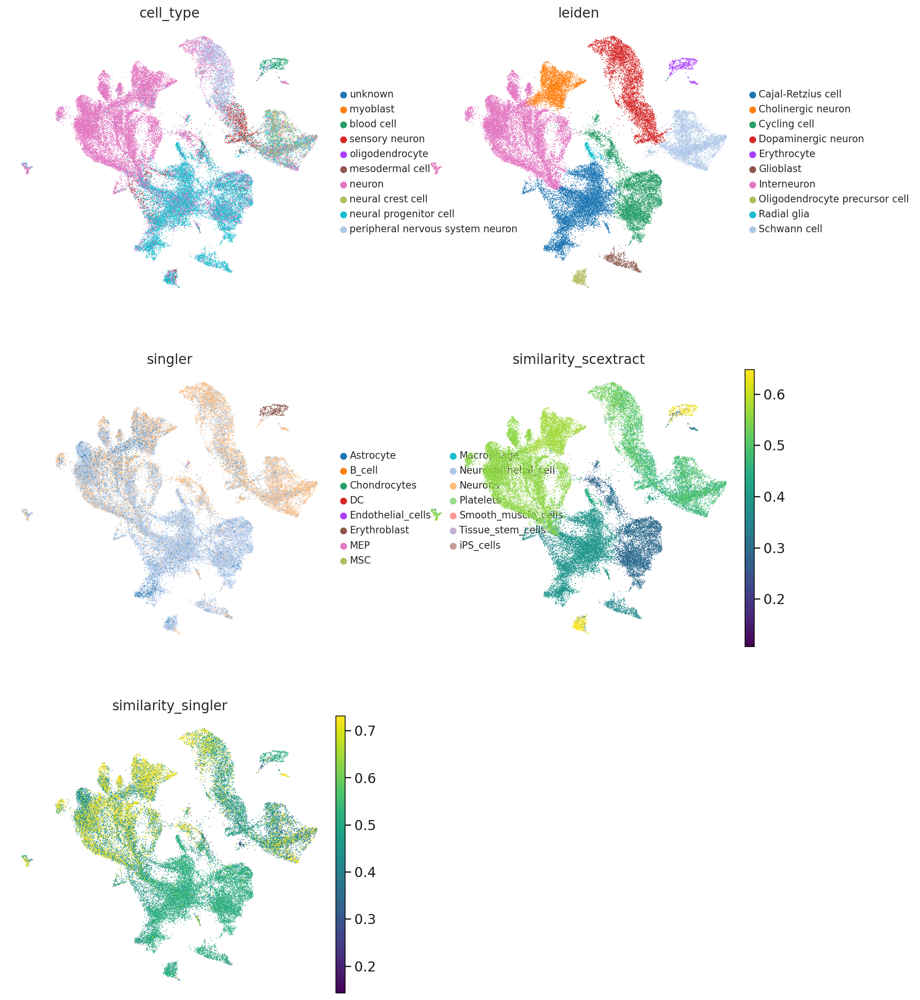

In [20]:
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben_, color=['cell_type', 'leiden', 'singler', 'similarity_scextract', 'similarity_singler'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    # plt.savefig('figures/fig1/sample8_claude_deepseek_1_cell_type_similarity.pdf')
    plt.show()

In [11]:
adata_ben.obs.columns

Index(['Batch', 'n_genes', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'pct_counts_ribo', 'leiden', 'no_context_annotation', 'Certainty',
       'Source', 'Tissue', 'Disease', 'Developmental_stage', 'leiden_rough',
       'singler', 'cell_type', 'similarity_scextract',
       'similarity_no_context_annotation', 'similarity_singler'],
      dtype='object')

/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/wu/scanpy/scanpy/plotting/_tools/scatterplots.py:399: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


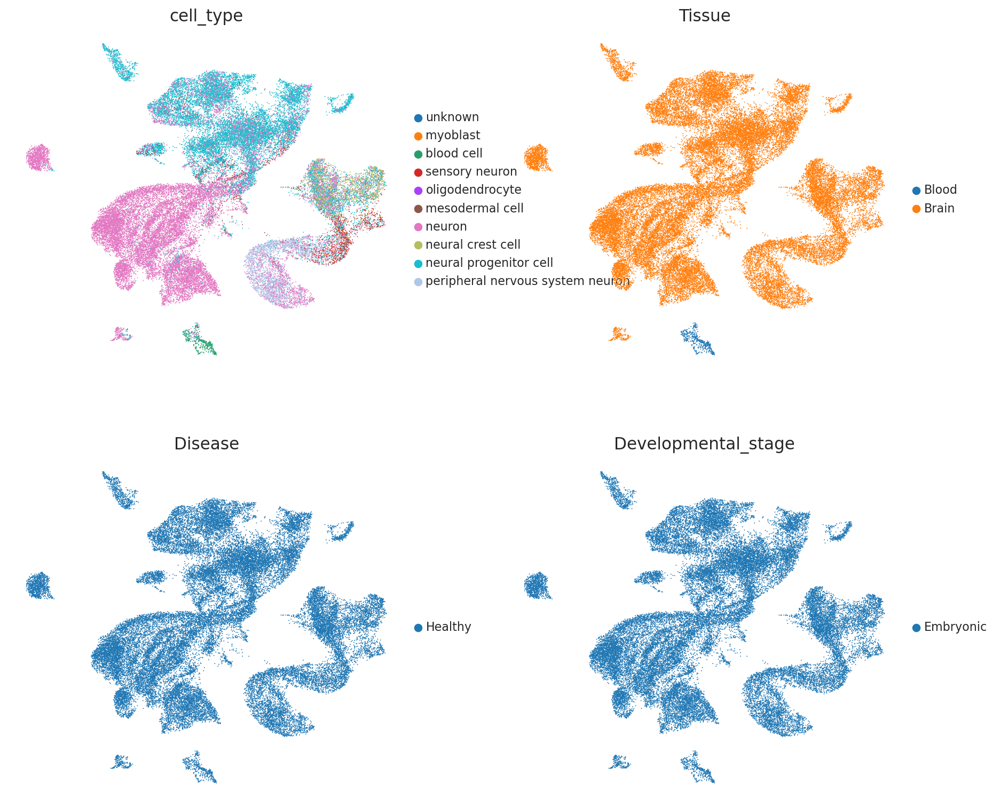

In [12]:
with rc_context({'figure.figsize': (6, 5.5)}):
    sc.pl.umap(adata_ben, color=['cell_type', 'Tissue', 'Disease', 'Developmental_stage'], ncols=2, frameon=False, show=False, cmap='viridis', use_raw=False, 
                legend_fontsize=10, legend_fontoutline=2)
    # plt.savefig('figures/fig1/sample8_claude_deepseek_1_cell_type_similarity.pdf')
    plt.show()